In [ ]:
#"import shutil
#shutil.rmtree("datasets")"

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.applications import VGG16, VGG19, InceptionV3, MobileNet, MobileNetV2
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
import cv2
import zipfile
from tensorflow.keras import backend as K
import time
import glob
import random
from itertools import cycle
import tensorflow.keras.backend as K

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')
#drive.flush_and_unmount()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:

# Set paths to your zip files
tomato_zip_path = '/content/drive/MyDrive/DM_PACKAGE_DATASET/plantdisease.zip'
cotton_zip_path = '/content/drive/MyDrive/DM_PACKAGE_DATASET/cottonleafinfection.zip'

extract_path = '/content/datasets/'

# Create the extraction directory
os.makedirs(extract_path, exist_ok=True)

# Extract the tomato dataset
with zipfile.ZipFile(tomato_zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# Extract the cotton dataset
with zipfile.ZipFile(cotton_zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Extraction completed!")

Extraction completed!


In [ ]:
# Check the directory structure of the extracted datasets
def print_directory_structure(path, level=0):
    if level < 3:
        print("  " * level + os.path.basename(path))
        if os.path.isdir(path):
            for item in os.listdir(path):
                print_directory_structure(os.path.join(path, item), level + 1)

print("Dataset Directory Structure:")
print_directory_structure(extract_path)

# Count number of images in each directory
tomato_train_path = os.path.join(extract_path, 'PlantVillage')
cotton_train_path = os.path.join(extract_path, 'cotton_infection_dir_ready/train')
cotton_test_path = os.path.join(extract_path, 'cotton_infection_dir_ready/test')


def count_images(directory):
    image_count = {}
    for root, dirs, files in os.walk(directory):
        if files:
            category = os.path.basename(root)
            image_count[category] = len([f for f in files if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
    return image_count

tomato_train_counts = count_images(tomato_train_path)
cotton_train_counts = count_images(cotton_train_path)
cotton_test_counts = count_images(cotton_test_path)


print("\nTomato Train Dataset Classes and Image Counts:")
for category, count in tomato_train_counts.items():
    print(f"{category}: {count} images")


print("\nCotton Train Dataset Classes and Image Counts:")
for category, count in cotton_train_counts.items():
    print(f"{category}: {count} images")


print("\nCotton Test Dataset Classes and Image Counts:")
for category, count in cotton_test_counts.items():
    print(f"{category}: {count} images")

Dataset Directory Structure:

  PlantVillage
    Pepper__bell___healthy
    Tomato_Septoria_leaf_spot
    Tomato_healthy
    Potato___healthy
    Potato___Early_blight
    Potato___Late_blight
    Tomato__Target_Spot
    Tomato_Early_blight
    Tomato_Bacterial_spot
    Tomato__Tomato_YellowLeaf__Curl_Virus
    Tomato_Spider_mites_Two_spotted_spider_mite
    Tomato__Tomato_mosaic_virus
    Tomato_Late_blight
    Tomato_Leaf_Mold
    Pepper__bell___Bacterial_spot
  cotton_infection_dir_ready
    test
    train
  plantvillage
    PlantVillage

Tomato Train Dataset Classes and Image Counts:
Pepper__bell___healthy: 1478 images
Tomato_Septoria_leaf_spot: 1771 images
Tomato_healthy: 1591 images
Potato___healthy: 152 images
Potato___Early_blight: 1000 images
Potato___Late_blight: 1000 images
Tomato__Target_Spot: 1404 images
Tomato_Early_blight: 1000 images
Tomato_Bacterial_spot: 2127 images
Tomato__Tomato_YellowLeaf__Curl_Virus: 3208 images
Tomato_Spider_mites_Two_spotted_spider_mite: 1676 im

In [ ]:
# Define the target classes as shown in the directory output
tomato_classes = [
    'Tomato_Bacterial_spot',
    'Tomato_Early_blight',
    'Tomato_healthy',
    'Tomato_Late_blight',
    'Tomato_Leaf_Mold',
    'Tomato_Septoria_leaf_spot',
    'Tomato_Spider_mites_Two_spotted_spider_mite',
    'Tomato__Target_Spot',
    'Tomato__Tomato_mosaic_virus',
    'Tomato__Tomato_YellowLeaf__Curl_Virus'
]

cotton_classes = [
    'bacterial_blight',
    'curl_virus',
    'healthy',
    'fussarium_wilt'
]

# Create directories for organized data
organized_data_path = '/content/organized_data'
train_dir = os.path.join(organized_data_path, 'train')
test_dir = os.path.join(organized_data_path, 'test')

os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Create subdirectories for each class
for class_name in tomato_classes + cotton_classes:
    os.makedirs(os.path.join(train_dir, class_name), exist_ok=True)
    os.makedirs(os.path.join(test_dir, class_name), exist_ok=True)

# Copy and split the images into train and test sets
import shutil
from sklearn.model_selection import train_test_split

def copy_images(source_dir, class_name, train_dir, test_dir, test_ratio=0.1):
    class_dir = os.path.join(source_dir, class_name)
    if not os.path.exists(class_dir):
        print(f"Directory {class_dir} does not exist.")
        return

    # Get all image files
    image_files = [f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    # Split into train and test
    train_files, test_files = train_test_split(image_files, test_size=test_ratio, random_state=42)

    # Copy train files
    for file in train_files:
        src = os.path.join(class_dir, file)
        dst = os.path.join(train_dir, class_name, file)
        shutil.copy(src, dst)

    # Copy test files
    for file in test_files:
        src = os.path.join(class_dir, file)
        dst = os.path.join(test_dir, class_name, file)
        shutil.copy(src, dst)

    print(f"Copied {len(train_files)} training images and {len(test_files)} testing images for class {class_name}")

# Copy tomato images from PlantVillage directory
tomato_path = os.path.join(extract_path, 'PlantVillage')
for class_name in tomato_classes:
    copy_images(tomato_path, class_name, train_dir, test_dir)

# Copy cotton images - already split into train and test
cotton_train_path = os.path.join(extract_path, 'cotton_infection_dir_ready/train')
cotton_test_path = os.path.join(extract_path, 'cotton_infection_dir_ready/test')

# Function to copy without splitting (for pre-split cotton dataset)
def copy_presplit_images(source_dir, target_dir, class_names):
    for class_name in class_names:
        class_dir = os.path.join(source_dir, class_name)
        if not os.path.exists(class_dir):
            print(f"Directory {class_dir} does not exist.")
            continue

        # Get all image files
        image_files = [f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

        # Copy files
        for file in image_files:
            src = os.path.join(class_dir, file)
            dst = os.path.join(target_dir, class_name, file)
            shutil.copy(src, dst)

        print(f"Copied {len(image_files)} images for class {class_name}")

# Copy cotton training images
copy_presplit_images(cotton_train_path, train_dir, cotton_classes)

# Copy cotton test images
copy_presplit_images(cotton_test_path, test_dir, cotton_classes)

# Count the organized images
def count_images(directory):
    image_count = {}
    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)
        if os.path.isdir(class_dir):
            image_count[class_name] = len([f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
    return image_count

train_counts = count_images(train_dir)
test_counts = count_images(test_dir)

print("\nOrganized Training Data:")
for category, count in train_counts.items():
    print(f"{category}: {count} images")

print("\nOrganized Testing Data:")
for category, count in test_counts.items():
    print(f"{category}: {count} images")

Copied 1914 training images and 213 testing images for class Tomato_Bacterial_spot
Copied 900 training images and 100 testing images for class Tomato_Early_blight
Copied 1431 training images and 160 testing images for class Tomato_healthy
Copied 1718 training images and 191 testing images for class Tomato_Late_blight
Copied 856 training images and 96 testing images for class Tomato_Leaf_Mold
Copied 1593 training images and 178 testing images for class Tomato_Septoria_leaf_spot
Copied 1508 training images and 168 testing images for class Tomato_Spider_mites_Two_spotted_spider_mite
Copied 1263 training images and 141 testing images for class Tomato__Target_Spot
Copied 335 training images and 38 testing images for class Tomato__Tomato_mosaic_virus
Copied 2887 training images and 321 testing images for class Tomato__Tomato_YellowLeaf__Curl_Virus
Copied 434 images for class bacterial_blight
Copied 333 images for class curl_virus
Copied 340 images for class healthy
Copied 335 images for clas

Found 15847 images belonging to 14 classes.
Found 1949 images belonging to 14 classes.
Found 15847 images belonging to 14 classes.
Found 1949 images belonging to 14 classes.
Training classes (CNN): {'Tomato_Bacterial_spot': 0, 'Tomato_Early_blight': 1, 'Tomato_Late_blight': 2, 'Tomato_Leaf_Mold': 3, 'Tomato_Septoria_leaf_spot': 4, 'Tomato_Spider_mites_Two_spotted_spider_mite': 5, 'Tomato__Target_Spot': 6, 'Tomato__Tomato_YellowLeaf__Curl_Virus': 7, 'Tomato__Tomato_mosaic_virus': 8, 'Tomato_healthy': 9, 'bacterial_blight': 10, 'curl_virus': 11, 'fussarium_wilt': 12, 'healthy': 13}
Validation classes (CNN): {'Tomato_Bacterial_spot': 0, 'Tomato_Early_blight': 1, 'Tomato_Late_blight': 2, 'Tomato_Leaf_Mold': 3, 'Tomato_Septoria_leaf_spot': 4, 'Tomato_Spider_mites_Two_spotted_spider_mite': 5, 'Tomato__Target_Spot': 6, 'Tomato__Tomato_YellowLeaf__Curl_Virus': 7, 'Tomato__Tomato_mosaic_virus': 8, 'Tomato_healthy': 9, 'bacterial_blight': 10, 'curl_virus': 11, 'fussarium_wilt': 12, 'healthy': 13

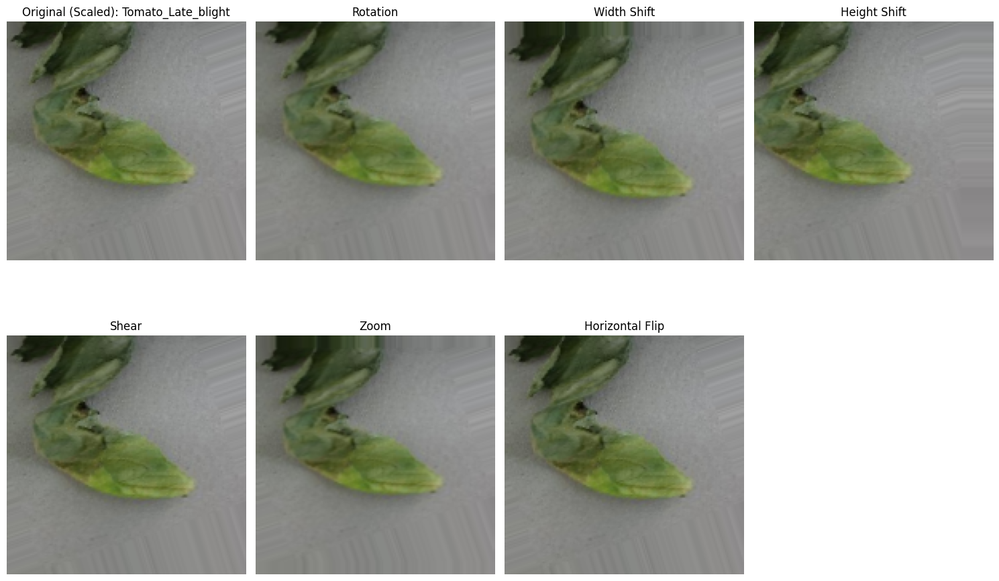

Visualizing Preprocessing for Transfer Learning (224x224):


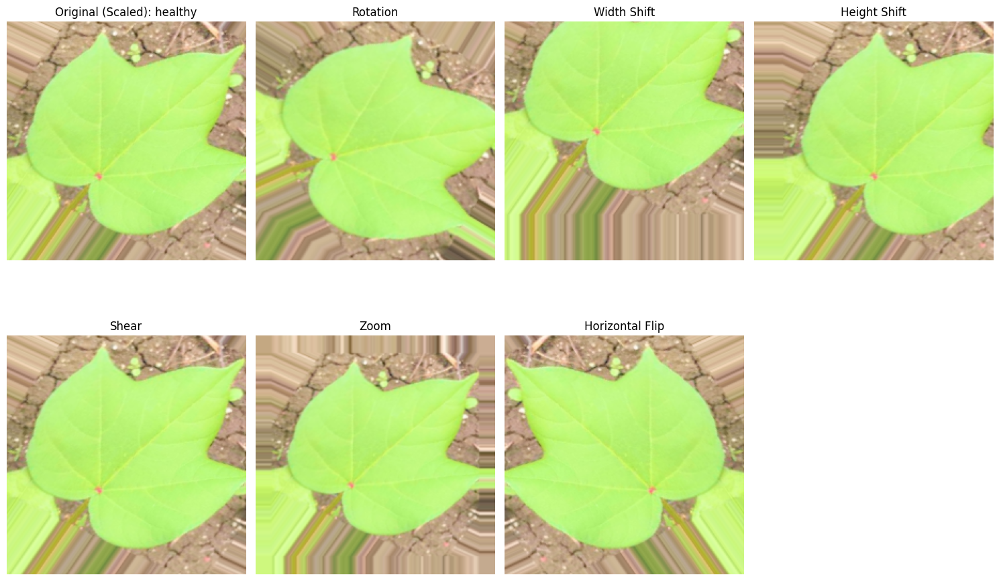


Original Training Images: 15847
After Augmentation (approx.): 95082


In [ ]:

# Define constants
BATCH_SIZE = 32
CUSTOM_CNN_IMAGE_SIZE = (150, 150)  # For custom 2D CNN
TRANSFER_LEARNING_IMAGE_SIZE = (224, 224)  # For transfer learning models

# Define ImageDataGenerator for preprocessing and augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Data scaling: Normalize pixel values to [0, 1]
    rotation_range=40,  # Rotation: 0 to 40 degrees
    width_shift_range=0.2,  # Width shifting: 20% of total width
    height_shift_range=0.2,  # Height shifting: 20% of total height
    shear_range=0.2,  # Shearing: 20%
    zoom_range=0.2,  # Zooming: 20%
    horizontal_flip=True,  # Horizontal flipping
    fill_mode='nearest'  # Fill mode for transformed pixels
)

# Validation/test data generator (only scaling, no augmentation)
valid_datagen = ImageDataGenerator(rescale=1./255)

# Create generators for custom CNN (150x150)
train_generator_cnn = train_datagen.flow_from_directory(
    train_dir,
    target_size=CUSTOM_CNN_IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True
)

valid_generator_cnn = valid_datagen.flow_from_directory(
    test_dir,
    target_size=CUSTOM_CNN_IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# Create generators for transfer learning (224x224)
train_generator_transfer = train_datagen.flow_from_directory(
    train_dir,
    target_size=TRANSFER_LEARNING_IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True
)

valid_generator_transfer = valid_datagen.flow_from_directory(
    test_dir,
    target_size=TRANSFER_LEARNING_IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# Verify generator output
print(f"Training classes (CNN): {train_generator_cnn.class_indices}")
print(f"Validation classes (CNN): {valid_generator_cnn.class_indices}")
print(f"Training classes (Transfer): {train_generator_transfer.class_indices}")
print(f"Validation classes (Transfer): {valid_generator_transfer.class_indices}")

# Visualizing preprocessing steps
def visualize_preprocessing(generator, class_names, num_images=1):
    # Get a batch of images
    images, labels = next(generator)
    class_indices = generator.class_indices
    inv_class_indices = {v: k for k, v in class_indices.items()}

    # Select a sample image
    sample_idx = 0
    sample_image = images[sample_idx]  # Already scaled to [0, 1]
    sample_label = inv_class_indices[np.argmax(labels[sample_idx])]

    # Original image (before augmentation, only scaled)
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 4, 1)
    plt.imshow(sample_image)
    plt.title(f"Original (Scaled): {sample_label}")
    plt.axis('off')

    # Define augmentations without rescaling (since the image is already scaled)
    augmentations = {
        'Rotation': ImageDataGenerator(rotation_range=40, fill_mode='nearest'),
        'Width Shift': ImageDataGenerator(width_shift_range=0.2, fill_mode='nearest'),
        'Height Shift': ImageDataGenerator(height_shift_range=0.2, fill_mode='nearest'),
        'Shear': ImageDataGenerator(shear_range=0.2, fill_mode='nearest'),
        'Zoom': ImageDataGenerator(zoom_range=0.2, fill_mode='nearest'),
        'Horizontal Flip': ImageDataGenerator(horizontal_flip=True, fill_mode='nearest')
    }

    # Plot each augmentation
    for i, (aug_name, aug_datagen) in enumerate(augmentations.items(), 2):
        aug_generator = aug_datagen.flow(np.expand_dims(sample_image, 0), batch_size=1)
        aug_image = next(aug_generator)[0]
        plt.subplot(2, 4, i)
        plt.imshow(aug_image)
        plt.title(f"{aug_name}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Visualize preprocessing for custom CNN (150x150)
print("Visualizing Preprocessing for Custom CNN (150x150):")
visualize_preprocessing(train_generator_cnn, tomato_classes + cotton_classes)

# Visualize preprocessing for transfer learning (224x224)
print("Visualizing Preprocessing for Transfer Learning (224x224):")
visualize_preprocessing(train_generator_transfer, tomato_classes + cotton_classes)

# Optional: Count augmented images (approximation based on your description)
original_train_images = sum(train_counts.values())
augmented_factor = 6  # As per your description: 6x after augmentation
total_augmented_images = original_train_images * augmented_factor
print(f"\nOriginal Training Images: {original_train_images}")
print(f"After Augmentation (approx.): {total_augmented_images}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 150, 150, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 75, 75, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 41472)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    21,234,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 14)             │         7,182 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,337,550 (81.40 MB)

 Trainable params: 21,336,078 (81.39 MB)

 Non-trainable params: 1,472 (5.75 KB)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
496/496 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step - accuracy: 0.5619 - loss: 1.5306
Epoch 1: val_accuracy improved from -inf to 0.41816, saving model to /content/drive/MyDrive/2d_cnn_best_model.h5


496/496 ━━━━━━━━━━━━━━━━━━━━ 134s 247ms/step - accuracy: 0.5620 - loss: 1.5299 - val_accuracy: 0.4182 - val_loss: 2.6233 - learning_rate: 0.0010
Epoch 2/30
496/496 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - accuracy: 0.7428 - loss: 0.7677
Epoch 2: val_accuracy improved from 0.41816 to 0.53617, saving model to /content/drive/MyDrive/2d_cnn_best_model.h5


496/496 ━━━━━━━━━━━━━━━━━━━━ 120s 241ms/step - accuracy: 0.7428 - loss: 0.7677 - val_accuracy: 0.5362 - val_loss: 2.4016 - learning_rate: 0.0010
Epoch 3/30
496/496 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - accuracy: 0.8010 - loss: 0.5892
Epoch 3: val_accuracy improved from 0.53617 to 0.67470, saving model to /content/drive/MyDrive/2d_cnn_best_model.h5


496/496 ━━━━━━━━━━━━━━━━━━━━ 141s 239ms/step - accuracy: 0.8010 - loss: 0.5891 - val_accuracy: 0.6747 - val_loss: 1.2795 - learning_rate: 0.0010
Epoch 4/30
496/496 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step - accuracy: 0.8357 - loss: 0.4939
Epoch 4: val_accuracy did not improve from 0.67470
496/496 ━━━━━━━━━━━━━━━━━━━━ 113s 227ms/step - accuracy: 0.8357 - loss: 0.4939 - val_accuracy: 0.5911 - val_loss: 1.9575 - learning_rate: 0.0010
Epoch 5/30
496/496 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step - accuracy: 0.8554 - loss: 0.4208
Epoch 5: val_accuracy improved from 0.67470 to 0.71986, saving model to /content/drive/MyDrive/2d_cnn_best_model.h5


496/496 ━━━━━━━━━━━━━━━━━━━━ 119s 241ms/step - accuracy: 0.8554 - loss: 0.4208 - val_accuracy: 0.7199 - val_loss: 1.0225 - learning_rate: 0.0010
Epoch 6/30
496/496 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - accuracy: 0.8737 - loss: 0.3666
Epoch 6: val_accuracy improved from 0.71986 to 0.78656, saving model to /content/drive/MyDrive/2d_cnn_best_model.h5


496/496 ━━━━━━━━━━━━━━━━━━━━ 119s 239ms/step - accuracy: 0.8737 - loss: 0.3666 - val_accuracy: 0.7866 - val_loss: 0.8030 - learning_rate: 0.0010
Epoch 7/30
496/496 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.8836 - loss: 0.3319
Epoch 7: val_accuracy did not improve from 0.78656
496/496 ━━━━━━━━━━━━━━━━━━━━ 115s 231ms/step - accuracy: 0.8836 - loss: 0.3319 - val_accuracy: 0.7394 - val_loss: 1.1734 - learning_rate: 0.0010
Epoch 8/30
496/496 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - accuracy: 0.8989 - loss: 0.2871
Epoch 8: val_accuracy improved from 0.78656 to 0.82760, saving model to /content/drive/MyDrive/2d_cnn_best_model.h5


496/496 ━━━━━━━━━━━━━━━━━━━━ 116s 234ms/step - accuracy: 0.8989 - loss: 0.2871 - val_accuracy: 0.8276 - val_loss: 0.7194 - learning_rate: 0.0010
Epoch 9/30
496/496 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - accuracy: 0.9148 - loss: 0.2551
Epoch 9: val_accuracy improved from 0.82760 to 0.90405, saving model to /content/drive/MyDrive/2d_cnn_best_model.h5


496/496 ━━━━━━━━━━━━━━━━━━━━ 122s 246ms/step - accuracy: 0.9148 - loss: 0.2552 - val_accuracy: 0.9041 - val_loss: 0.2856 - learning_rate: 0.0010
Epoch 10/30
496/496 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step - accuracy: 0.9168 - loss: 0.2487
Epoch 10: val_accuracy did not improve from 0.90405
496/496 ━━━━━━━━━━━━━━━━━━━━ 112s 225ms/step - accuracy: 0.9168 - loss: 0.2487 - val_accuracy: 0.6491 - val_loss: 1.6519 - learning_rate: 0.0010
Epoch 11/30
496/496 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - accuracy: 0.9170 - loss: 0.2377
Epoch 11: val_accuracy did not improve from 0.90405
496/496 ━━━━━━━━━━━━━━━━━━━━ 109s 221ms/step - accuracy: 0.9170 - loss: 0.2377 - val_accuracy: 0.8271 - val_loss: 0.6412 - learning_rate: 0.0010
Epoch 12/30
496/496 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - accuracy: 0.9260 - loss: 0.2228
Epoch 12: val_accuracy did not improve from 0.90405

Epoch 12: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
496/496 ━━━━━━━━━━━━━━━━━━━━ 109s 219ms/step - accuracy: 0.9260

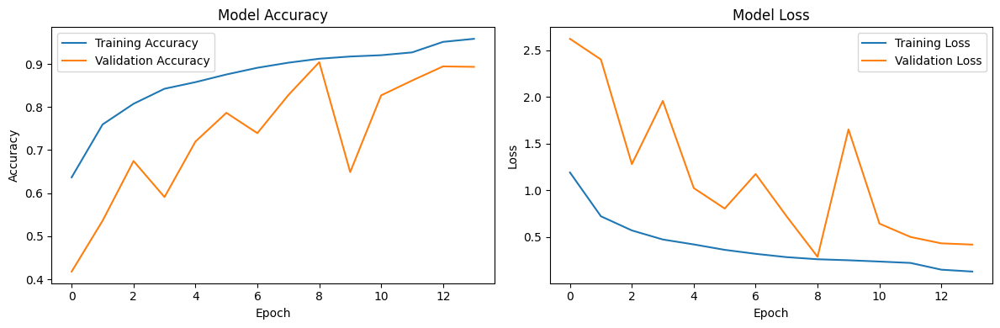

61/61 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.9065 - loss: 0.2840
Validation Loss: 0.2856
Validation Accuracy: 0.9041


In [ ]:

# Define the number of classes
NUM_CLASSES = len(tomato_classes + cotton_classes)  # 14 classes (10 tomato + 4 cotton)

# Build the 2D CNN model
def build_2d_cnn_model(input_shape=(150, 150, 3), num_classes=NUM_CLASSES):
    model = Sequential()

    # First Convolutional Block
    model.add(Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Second Convolutional Block
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Third Convolutional Block
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Flatten the output
    model.add(Flatten())

    # Fully Connected Layers with Dropout
    model.add(Dense(512, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))  # Dropout to reduce overfitting

    # Output Layer
    model.add(Dense(num_classes, activation='softmax'))

    return model

# Instantiate the model
cnn_model = build_2d_cnn_model()

# Compile the model
cnn_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Display model summary
cnn_model.summary()

# Define callbacks
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

model_checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/2d_cnn_best_model.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=3,
    min_lr=1e-6,
    verbose=1
)

# Train the model
history = cnn_model.fit(
    train_generator_cnn,
    epochs=30,
    validation_data=valid_generator_cnn,
    callbacks=[early_stopping, model_checkpoint, reduce_lr],
    verbose=1
)

# Plot training history
def plot_training_history(history):
    plt.figure(figsize=(12, 4))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Plot the training history
plot_training_history(history)

# Evaluate the model on the validation set
val_loss, val_accuracy = cnn_model.evaluate(valid_generator_cnn)
print(f"Validation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_accuracy:.4f}")

61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 72ms/step


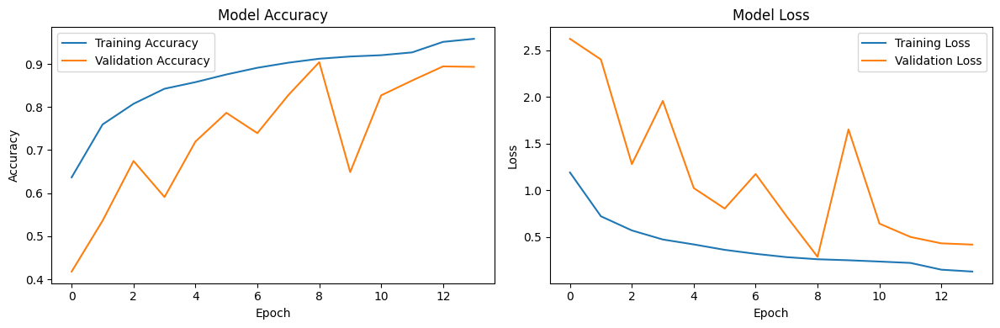

61/61 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - accuracy: 0.9065 - loss: 0.2840
Validation Loss: 0.2856
Validation Accuracy: 0.9041


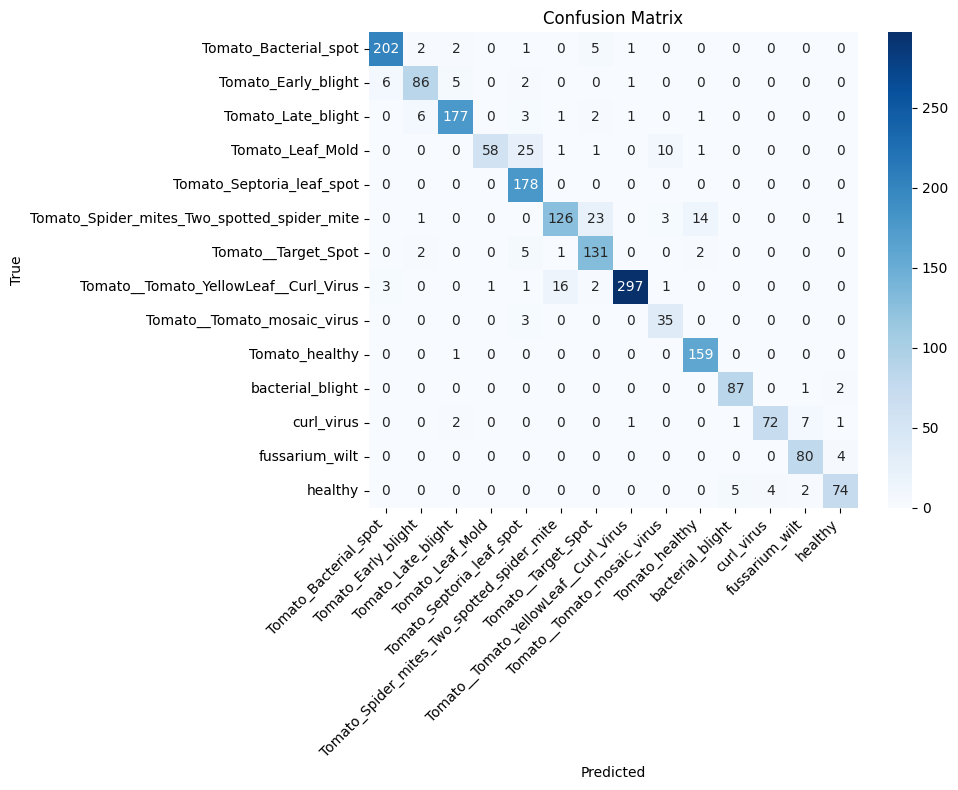

Number of misclassified images: 187 out of 1949

Classification Report:
                                             precision    recall  f1-score   support

                      Tomato_Bacterial_spot       0.96      0.95      0.95       213
                        Tomato_Early_blight       0.89      0.86      0.87       100
                         Tomato_Late_blight       0.95      0.93      0.94       191
                           Tomato_Leaf_Mold       0.98      0.60      0.75        96
                  Tomato_Septoria_leaf_spot       0.82      1.00      0.90       178
Tomato_Spider_mites_Two_spotted_spider_mite       0.87      0.75      0.81       168
                        Tomato__Target_Spot       0.80      0.93      0.86       141
      Tomato__Tomato_YellowLeaf__Curl_Virus       0.99      0.93      0.95       321
                Tomato__Tomato_mosaic_virus       0.71      0.92      0.80        38
                             Tomato_healthy       0.90      0.99      0.94   

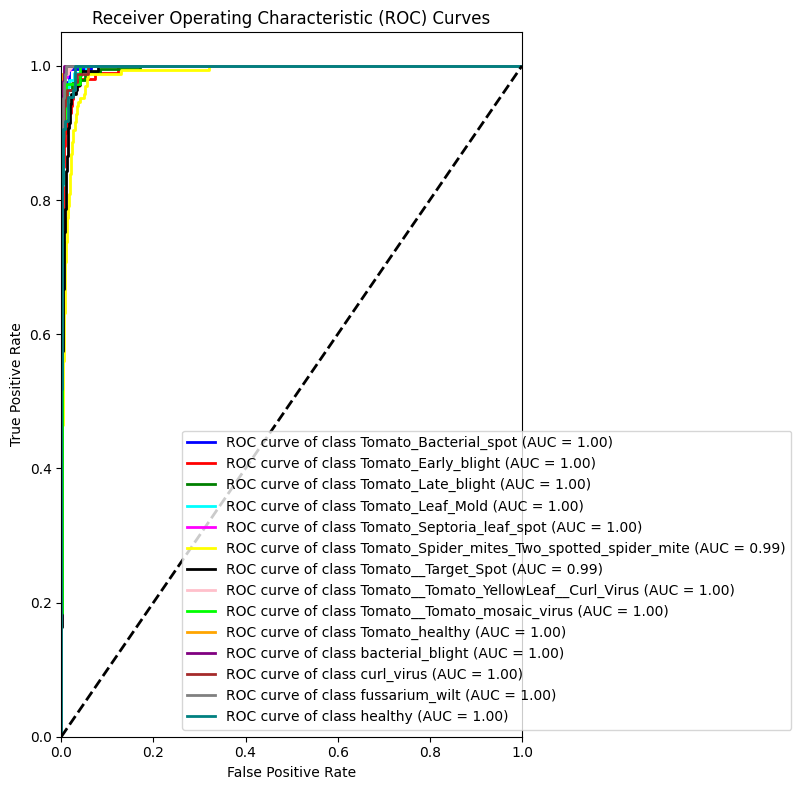

Average AUC Score: 0.9973


In [ ]:

# Import additional required libraries for evaluation
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from itertools import cycle
import numpy as np


# Evaluate the model on the validation set
valid_generator_cnn.reset()
predictions = cnn_model.predict(valid_generator_cnn)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = valid_generator_cnn.classes
class_labels = list(valid_generator_cnn.class_indices.keys())

# 1) Accuracy Graphs (Training and Validation Accuracy)
plot_training_history(history)  # Already defined in previous code

# Calculate and print overall accuracy
val_loss, val_accuracy = cnn_model.evaluate(valid_generator_cnn)
print(f"Validation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_accuracy:.4f}")

# 2) Confusion Matrix
cm = confusion_matrix(true_classes, predicted_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Misclassified images count
misclassified = np.sum(cm) - np.sum(np.diag(cm))
print(f"Number of misclassified images: {misclassified} out of {np.sum(cm)}")

# 3) Classification Report (Precision, Recall, F1-Score)
print("\nClassification Report:")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# 4) ROC Curves and AUC Scores
fpr = dict()
tpr = dict()
roc_auc = dict()
n_classes = NUM_CLASSES

# Compute ROC curve and AUC for each class
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(valid_generator_cnn.classes == i, predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'red', 'green', 'cyan', 'magenta', 'yellow', 'black', 'pink', 'lime', 'orange', 'purple', 'brown', 'gray', 'teal'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'ROC curve of class {class_labels[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc="lower right", bbox_to_anchor=(1.6, 0))
plt.tight_layout()
plt.show()

# Compute and print average AUC
average_auc = np.mean(list(roc_auc.values()))
print(f"Average AUC Score: {average_auc:.4f}")

In [ ]:
# Load the saved model if training was done earlier
cnn_model = tf.keras.models.load_model('/content/drive/MyDrive/2d_cnn_best_model.h5')

# Perform a dummy prediction to initialize the model’s graph
dummy_input = np.zeros((1, 150, 150, 3))  # Shape matches input: 150x150x3
cnn_model.predict(dummy_input)  # Initializes the output

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 883ms/step


array([[9.4425127e-11, 2.8565822e-10, 9.9992740e-01, 4.9249996e-07,
        8.5523039e-10, 9.0040481e-10, 4.4912499e-10, 2.4304570e-06,
        2.9352186e-06, 6.6535293e-05, 1.2107672e-10, 2.2819002e-07,
        3.6636138e-08, 2.0996465e-09]], dtype=float32)

Last convolutional layer found at index: 6
Found 14 sample images for visualization

Grad-CAM Visualization:

Processing image: /content/organized_data/test/Tomato_Bacterial_spot/605dda2d-be55-45cc-b247-76903d159255___UF.GRC_BS_Lab Leaf 8749.JPG
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer']
Received: inputs=Tensor(shape=(1, 150, 150, 3))
  warnings.warn(msg)


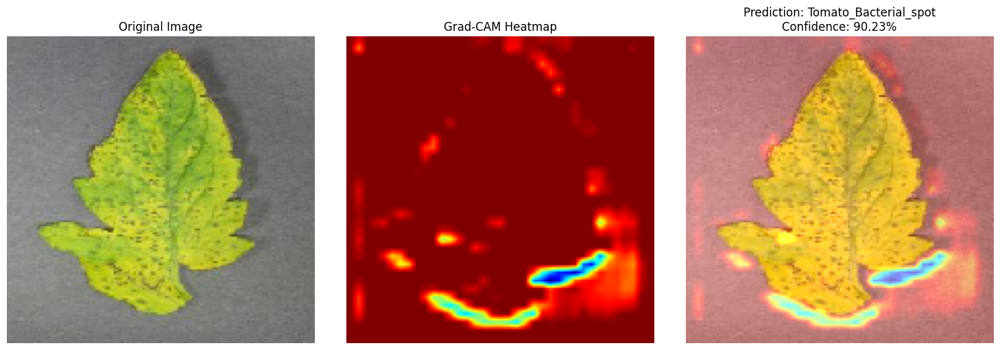

Predicted class: Tomato_Bacterial_spot with 90.23% confidence

Processing image: /content/organized_data/test/Tomato_Early_blight/375a4113-c296-4b3a-897b-da6f4ac660dc___RS_Erly.B 6408.JPG
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


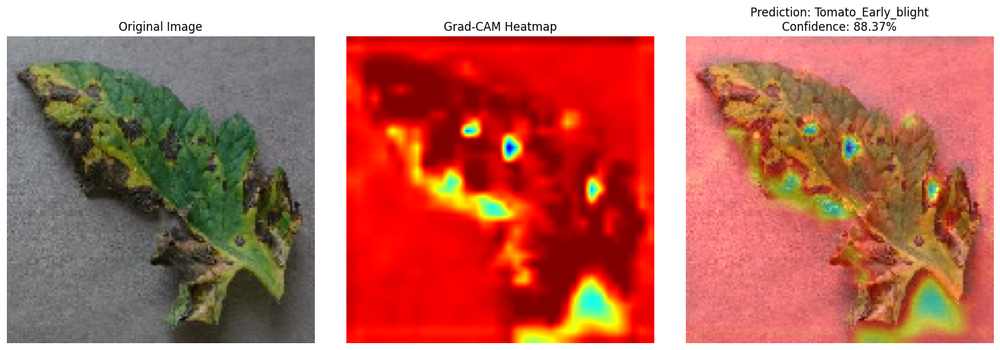

Predicted class: Tomato_Early_blight with 88.37% confidence

Processing image: /content/organized_data/test/Tomato_Late_blight/745086e9-2e07-48e3-809e-7448e14332ef___GHLB2 Leaf 134.2.JPG
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


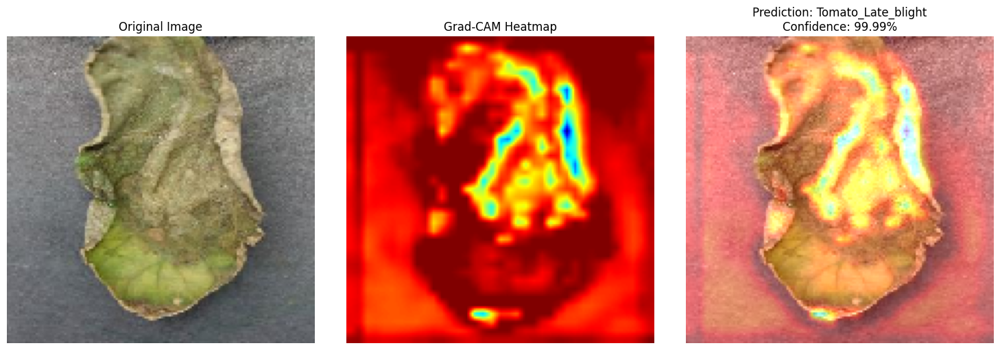

Predicted class: Tomato_Late_blight with 99.99% confidence

Processing image: /content/organized_data/test/Tomato_Leaf_Mold/51cb012e-4646-447c-b63f-9084a370b781___Crnl_L.Mold 6916.JPG
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


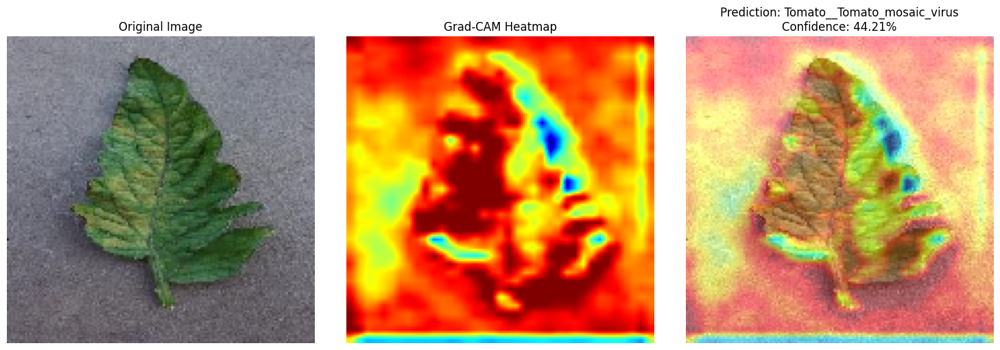

Predicted class: Tomato__Tomato_mosaic_virus with 44.21% confidence

Processing image: /content/organized_data/test/Tomato_Septoria_leaf_spot/0aa486df-97b6-4764-89a9-d193e16aabbb___Keller.St_CG 1931.JPG
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


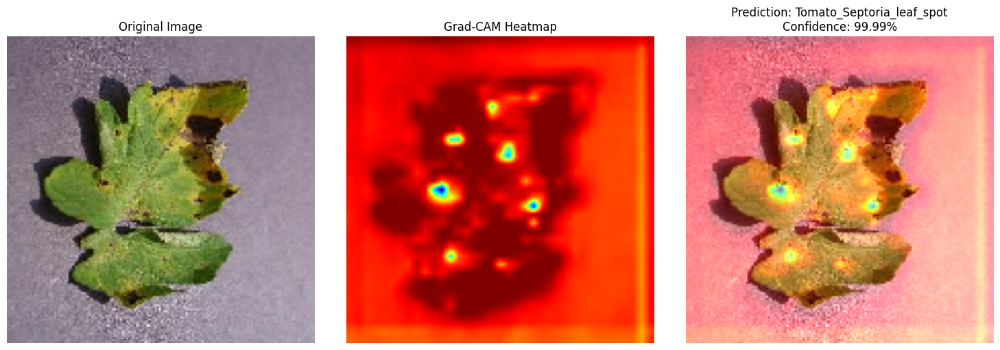

Predicted class: Tomato_Septoria_leaf_spot with 99.99% confidence

Processing image: /content/organized_data/test/Tomato_Spider_mites_Two_spotted_spider_mite/264feee4-5e1c-4bd4-94d8-7b27da8940d7___Com.G_SpM_FL 1613.JPG
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


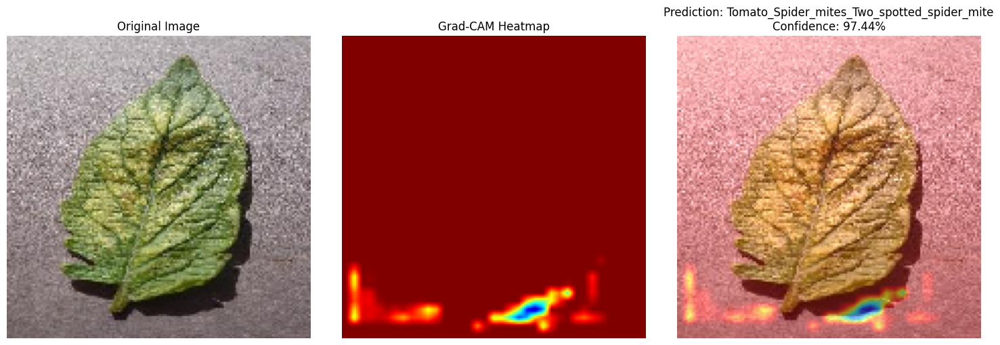

Predicted class: Tomato_Spider_mites_Two_spotted_spider_mite with 97.44% confidence

Processing image: /content/organized_data/test/Tomato__Target_Spot/8fe77ca8-8f18-482f-8c30-745efe6ae1c9___Com.G_TgS_FL 8107.JPG
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


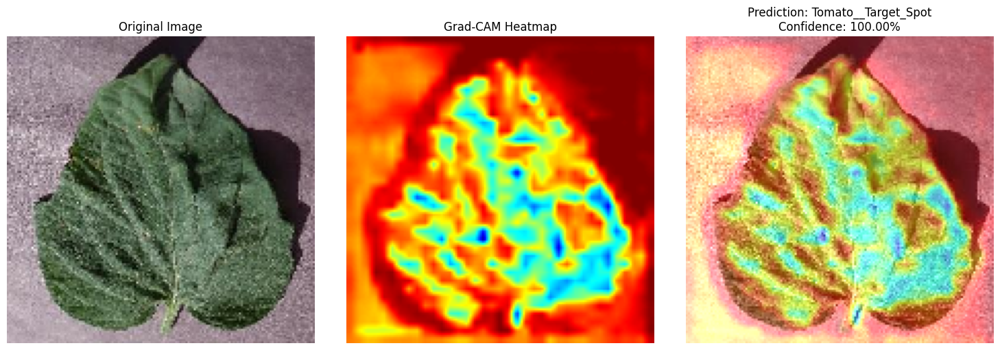

Predicted class: Tomato__Target_Spot with 100.00% confidence

Processing image: /content/organized_data/test/Tomato__Tomato_YellowLeaf__Curl_Virus/641037eb-ab10-44eb-9ddb-7d3d8e363008___YLCV_NREC 2191.JPG
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


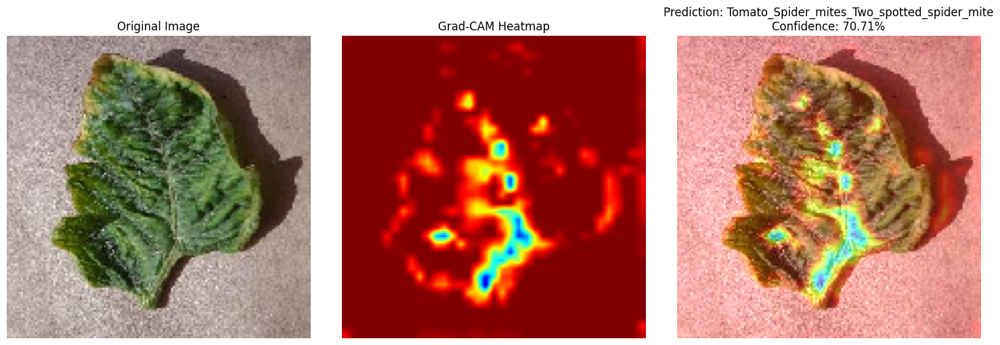

Predicted class: Tomato_Spider_mites_Two_spotted_spider_mite with 70.71% confidence

Processing image: /content/organized_data/test/Tomato__Tomato_mosaic_virus/db6ecf05-d8bd-431f-86d7-d3f5403eab81___PSU_CG 2408.JPG
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


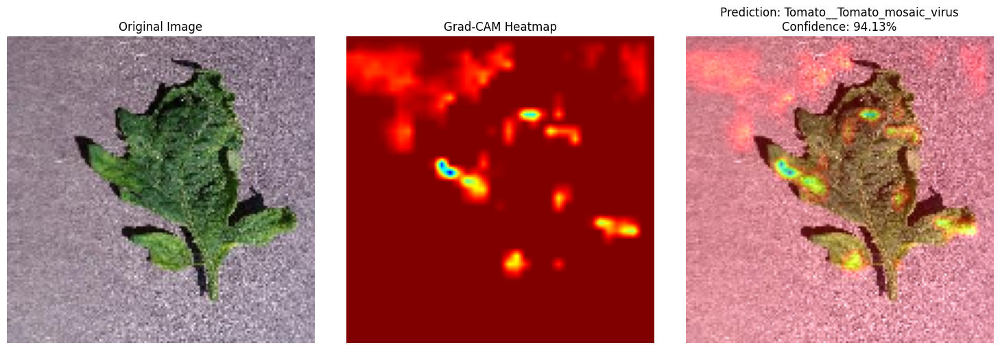

Predicted class: Tomato__Tomato_mosaic_virus with 94.13% confidence

Processing image: /content/organized_data/test/Tomato_healthy/8db75488-efa8-48f9-bfe8-453b1b5a2b94___RS_HL 9706.JPG
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


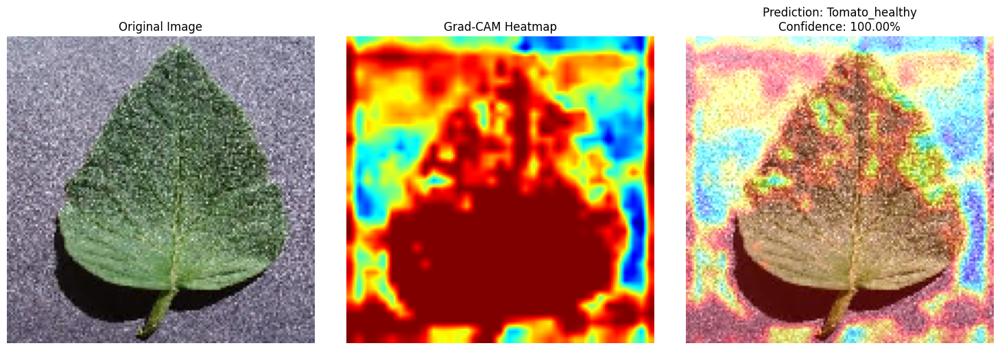

Predicted class: Tomato_healthy with 100.00% confidence

Processing image: /content/organized_data/test/bacterial_blight/bact210.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


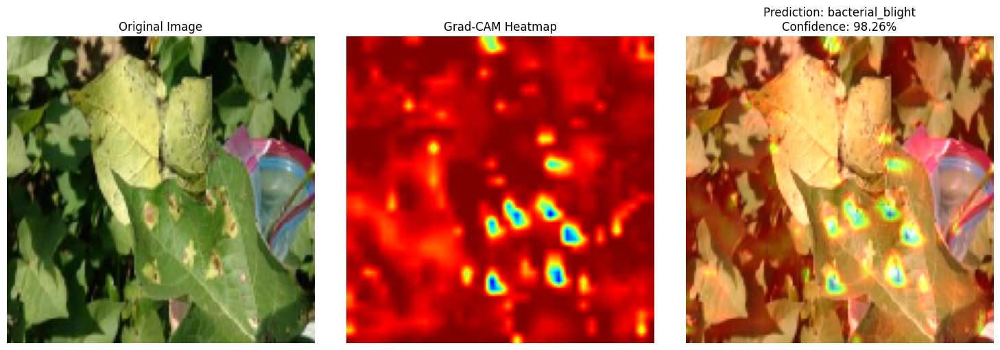

Predicted class: bacterial_blight with 98.26% confidence

Processing image: /content/organized_data/test/curl_virus/curl380.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


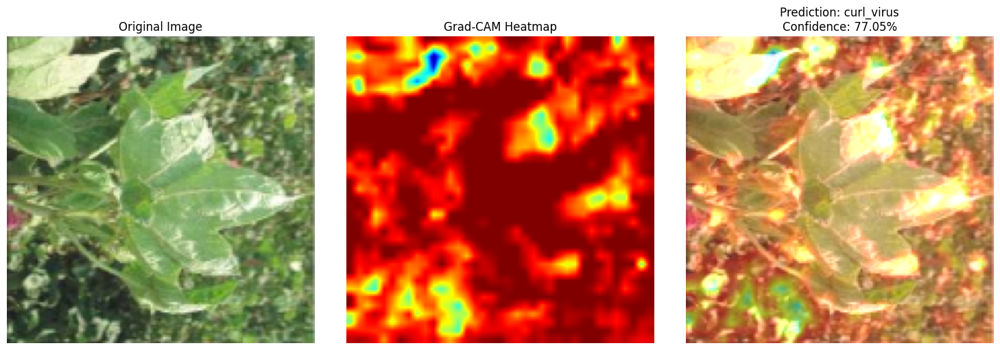

Predicted class: curl_virus with 77.05% confidence

Processing image: /content/organized_data/test/fussarium_wilt/fus64.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


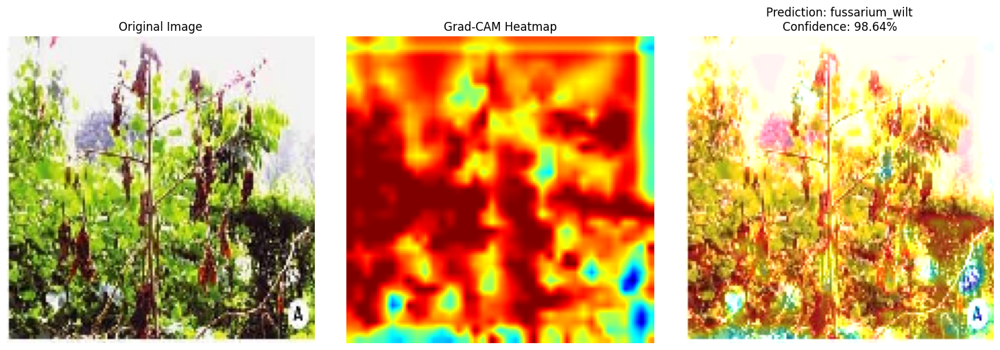

Predicted class: fussarium_wilt with 98.64% confidence

Processing image: /content/organized_data/test/healthy/h223.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


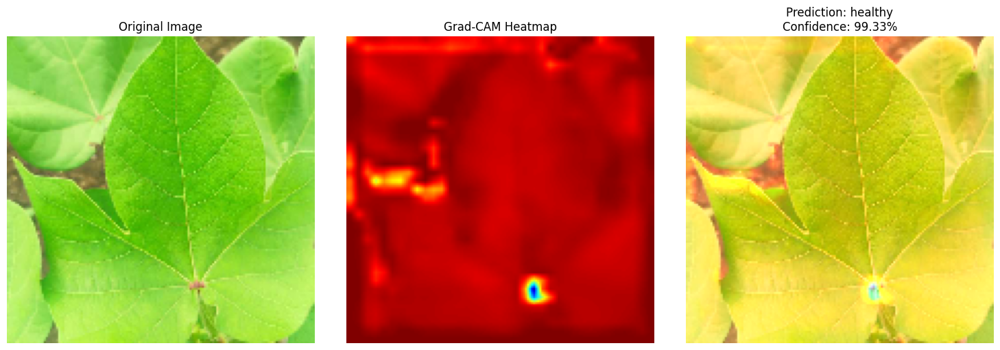

Predicted class: healthy with 99.33% confidence


In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Load the trained model
cnn_model = tf.keras.models.load_model('/content/drive/MyDrive/2d_cnn_best_model.h5')

# Function to find valid images
def find_valid_images(base_dir, class_names, num_images=14):
    valid_images = []
    for class_name in class_names:
        class_dir = f"{base_dir}/{class_name}"
        try:
            files = os.listdir(class_dir)
            image_files = [f for f in files if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
            if image_files:
                valid_images.append(os.path.join(class_dir, image_files[0]))
                if len(valid_images) >= num_images:
                    break
        except:
            continue
    return valid_images

# For Sequential models, we need a different approach to Grad-CAM
def make_gradcam_heatmap(img_array, model, last_conv_layer_idx, pred_index=None):
    # First, create a model that maps the input image to the activations
    # of the last conv layer
    last_conv_layer = model.layers[last_conv_layer_idx]
    last_conv_layer_model = Model(
        inputs=model.inputs,
        outputs=last_conv_layer.output
    )

    # Create a model that maps the activations of the last conv layer
    # to the final class predictions
    classifier_input = tf.keras.Input(shape=last_conv_layer.output.shape[1:])
    x = classifier_input
    for layer in model.layers[last_conv_layer_idx+1:]:
        x = layer(x)
    classifier_model = Model(inputs=classifier_input, outputs=x)

    # Run the image through the base model
    with tf.GradientTape() as tape:
        # Compute activations of the last conv layer and make the tape watch it
        last_conv_layer_output = last_conv_layer_model(img_array)
        tape.watch(last_conv_layer_output)

        # Run the activations through the classifier to get the prediction
        preds = classifier_model(last_conv_layer_output)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # Gradient of the output with respect to last conv layer output
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # Average gradients over each channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weight activation channels by gradients
    last_conv_layer_output = last_conv_layer_output.numpy()[0]
    pooled_grads = pooled_grads.numpy()

    # Apply the weights to the activation channels
    for i in range(pooled_grads.shape[-1]):
        last_conv_layer_output[:, :, i] *= pooled_grads[i]

    # Average over all weighted activation channels
    heatmap = np.mean(last_conv_layer_output, axis=-1)

    # Normalize the heatmap between 0 and 1
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)

    return heatmap

# Find the index of the last convolutional layer
def find_last_conv_layer_idx(model):
    for i, layer in enumerate(model.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_idx = i
    return last_conv_idx

# Apply the heatmap to an image
def apply_heatmap(original_img, heatmap, alpha=0.5):
    # Resize the heatmap to match the original image size
    heatmap = cv2.resize(heatmap, (original_img.shape[1], original_img.shape[0]))

    # Convert heatmap to RGB
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Superimpose the heatmap on original image
    superimposed_img = heatmap * alpha + original_img
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)

    return heatmap, superimposed_img

# Function to visualize Grad-CAM for a given image
def visualize_gradcam(model, img_path, last_conv_layer_idx, class_labels):
    try:
        # Load and preprocess the image
        img = load_img(img_path, target_size=(150, 150))
        img_array = img_to_array(img)
        original_img = img_array.copy()
        img_array = np.expand_dims(img_array, axis=0) / 255.0

        # Make predictions
        preds = model.predict(img_array)
        pred_idx = np.argmax(preds[0])
        pred_class = class_labels[pred_idx]
        confidence = preds[0][pred_idx] * 100

        # Generate Grad-CAM heatmap
        heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_idx, pred_idx)

        # Apply heatmap to image
        heatmap_display, superimposed = apply_heatmap(original_img, heatmap)

        # Display results
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(original_img.astype('uint8'))
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(heatmap_display)
        plt.title('Grad-CAM Heatmap')
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(superimposed)
        plt.title(f'Prediction: {pred_class}\nConfidence: {confidence:.2f}%')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

        return pred_class, confidence

    except Exception as e:
        print(f"Error processing {img_path}: {str(e)}")
        import traceback
        traceback.print_exc()
        return None, None

# Get class labels from valid generator
class_labels = list(valid_generator_cnn.class_indices.keys())

# Find the last Conv2D layer index
last_conv_layer_idx = find_last_conv_layer_idx(cnn_model)
print(f"Last convolutional layer found at index: {last_conv_layer_idx}")

# Find sample images
sample_image_paths = find_valid_images('/content/organized_data/test', class_labels)
if not sample_image_paths:
    print("No valid images found! Check paths and file extensions.")
else:
    print(f"Found {len(sample_image_paths)} sample images for visualization")

# Visualize Grad-CAM for each image
print("\nGrad-CAM Visualization:")
for img_path in sample_image_paths:
    print(f"\nProcessing image: {img_path}")
    class_name, confidence = visualize_gradcam(cnn_model, img_path, last_conv_layer_idx, class_labels)
    if class_name:
        print(f"Predicted class: {class_name} with {confidence:.2f}% confidence")